<a href="https://colab.research.google.com/github/jorge-flores-py/APRENDIZAJE-AUTOMATICO-2/blob/main/TP_5_FLORES_JORGE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# TP2 – Aprendizaje por Refuerzo
## Entorno: CartPole-v1
## Alumno: Jorge Flores



#  – Explicación del Entorno CartPole-v1

El entorno **CartPole-v1** es un clásico del aprendizaje por refuerzo. Su objetivo consiste en mantener un poste (palo) en equilibrio sobre un carrito que se mueve hacia la izquierda o la derecha.

A continuación se explican todos los elementos del entorno:

---

## 🔵 1) Espacio de Observaciones (Estado)

El estado del entorno es un vector continuo de **4 valores**, representado como:
[x, x_dot, theta, theta_dot]


Estos valores significan:

1. **x – Posición del carrito**  
   Indica qué tan lejos está el carrito del centro.  
   Rango aproximado: **[-4.8, +4.8]**.

2. **x_dot – Velocidad del carrito**  
   Señala si el carrito se mueve hacia la izquierda o la derecha.  
   Aunque aparece como sin límite, en la práctica ronda **[-3, 3]**.

3. **theta – Ángulo del poste**  
   Es la inclinación del palo respecto de la vertical.  
   Rango seguro: **[-0.418, +0.418] rad** (~±24°).  
   Superar este ángulo implica que el poste se cae.

4. **theta_dot – Velocidad angular del poste**  
   Qué tan rápido se está inclinando el poste.  
   También es continuo.

El estado es **continuo**, por lo que algoritmos tabulares como Q-Learning deben discretizarlo, mientras que métodos basados en redes neuronales (como DQN) pueden manejarlo directamente.

---

## 🔵 2) Espacio de Acciones

Hay solo **2 acciones discretas** disponibles:

| Acción | Significado |
|--------|-------------|
| **0** | Mover el carrito hacia la **izquierda** |
| **1** | Mover el carrito hacia la **derecha** |

El agente debe decidir en cada paso hacia cuál lado aplicar fuerza para mantener el poste en equilibrio.

---

## 🔵 3) Recompensa

La recompensa en CartPole es muy simple:

- Cada paso donde el poste **sigue en pie** → **+1**.
- Si el carrito se sale del rango permitido o el palo se cae → el episodio termina.

Ejemplos:

- Episodio de 12 pasos → **12 puntos**  
- Episodio de 240 pasos → **240 puntos**  
- Episodio perfecto → **500 puntos** (máximo permitido)

---

## 🔵 4) Condiciones de Terminación

Un episodio termina cuando sucede alguno de los siguientes eventos:

1. El carrito sale de los límites horizontales.  
2. El poste se inclina más de **24°**.  
3. Se alcanzan **500 pasos**, lo cual indica un episodio perfecto.

---

## 🔵 5) Objetivo del Agente

El objetivo del agente es **maximizar la recompensa total**, es decir, mantener el poste en equilibrio durante la mayor cantidad de pasos posible. Para lograrlo debe aprender a:

- corregir la inclinación del poste,  
- anticipar caídas,  
- mover el carrito en la dirección adecuada.

Este entorno es ampliamente utilizado para comparar algoritmos de aprendizaje por refuerzo debido a que:

- es simple,  
- tiene dinámica continua,  
- y muestra diferencias claras entre políticas aleatorias, tabulares y basadas en redes neuronales.

---



In [66]:
# @title Librerías necesarias para el TP2
# Librerías necesarias para el TP2 – Aprendizaje por Refuerzo (CartPole)

import gymnasium as gym
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from collections import deque
import random
import imageio
import cv2
from IPython.display import HTML
from base64 import b64encode


In [67]:
#@title Reproducibilidad
np.random.seed(42)
torch.manual_seed(42)
random.seed(42)


In [68]:
#@title Crear el entorno CartPole-v1
env = gym.make("CartPole-v1")

print("🎯 ENTORNO CARTPOLE-V1")
print("=" * 50)
print("Espacio de observaciones:", env.observation_space)
print("Dimensión del estado:", env.observation_space.shape[0])
print("Espacio de acciones:", env.action_space)
print("Acciones: 0 = Izquierda | 1 = Derecha")

obs, _ = env.reset()
print("\nEjemplo de estado inicial:", obs)


🎯 ENTORNO CARTPOLE-V1
Espacio de observaciones: Box([-4.8               -inf -0.41887903        -inf], [4.8               inf 0.41887903        inf], (4,), float32)
Dimensión del estado: 4
Espacio de acciones: Discrete(2)
Acciones: 0 = Izquierda | 1 = Derecha

Ejemplo de estado inicial: [ 0.01092178 -0.04018261  0.00424073 -0.02255111]


##Función para visualizar la política aprendida

A diferencia de entornos discretos como FrozenLake, el entorno CartPole-v1 tiene un
espacio de estados continuo. Por este motivo, no es posible mostrar la política en forma
de tabla o grilla. Para poder visualizar la política aprendida, se utiliza un método
estandarizado en la literatura de aprendizaje por refuerzo: graficar la acción elegida
por el agente en función de dos de las variables del estado.

En CartPole, las dos variables más relevantes para la toma de decisiones son:

- **theta**: ángulo del poste  
- **theta_dot**: velocidad angular del poste  

La función de visualización crea una malla 2D donde cada punto representa un estado
concreto (combinación de theta y theta_dot) y el color indica la acción que elegiría el
agente:

- Azul → Acción 0 (mover a la izquierda)  
- Rojo → Acción 1 (mover a la derecha)

Con este mapa se puede observar cómo el agente divide el espacio de estados en regiones
y cómo decide mover el carrito dependiendo del ángulo del poste y su velocidad angular.
Este tipo de representación es el equivalente a "mostrar la política" para entornos
continuos.


In [69]:
import numpy as np
import matplotlib.pyplot as plt

def visualizar_politica_cartpole(agent,
                                 angle_range=(-0.3, 0.3),
                                 ang_vel_range=(-2.0, 2.0),
                                 n_grid=80,
                                 titulo="Mapa de Política – CartPole"):

    angles = np.linspace(angle_range[0], angle_range[1], n_grid)
    ang_vels = np.linspace(ang_vel_range[0], ang_vel_range[1], n_grid)

    mapa = np.zeros((n_grid, n_grid))

    for i, theta in enumerate(angles):
        for j, theta_dot in enumerate(ang_vels):

            # Armamos un estado artificial
            # posición y velocidad del carrito = 0
            state = np.array([0.0, 0.0, theta, theta_dot])

            # Acción greedy del agente entrenado
            action = agent.seleccionar_accion(state, entrenar=False)
            mapa[j, i] = action

    plt.figure(figsize=(7, 6))
    plt.imshow(
        mapa,
        origin='lower',
        extent=[angle_range[0], angle_range[1], ang_vel_range[0], ang_vel_range[1]],
        aspect='auto',
        cmap='bwr',       # blue-white-red (0=azul, 1=rojo)
        alpha=0.9
    )

    plt.colorbar(label='Acción (0=Izquierda, 1=Derecha)')
    plt.xlabel('Ángulo del poste (theta)')
    plt.ylabel('Velocidad angular (theta_dot)')
    plt.title(titulo)
    plt.grid(True, alpha=0.3)
    plt.show()


In [70]:
#@title PoliticaAleatoria
import numpy as np

class PoliticaAleatoria:
    def __init__(self, n_acciones):
        self.n_acciones = n_acciones
        self.epsilon = 1.0   # siempre aleatorio, pero lo mostramos para comparación

    def entrenar(self, env, episodios=500, max_steps=500):

        recompensas = []
        exitos = []   # éxito = episodios con >=195 pasos

        print("Entrenando política aleatoria...")

        for ep in range(episodios):
            obs, _ = env.reset()
            done = False
            total_r = 0

            for _ in range(max_steps):
                accion = self.seleccionar_accion(obs, entrenar=True)
                obs, r, done, truncated, _ = env.step(accion)

                if truncated:
                    done = True

                total_r += r
                if done:
                    break

            recompensas.append(total_r)

            # éxito = ≥195 pasos
            exito = 1 if total_r >= 195 else 0
            exitos.append(exito)

            # LOGS cada 100 episodios
            if (ep + 1) % 100 == 0:
                tasa_exito = np.mean(exitos[-100:])
                prom_recomp = np.mean(recompensas[-100:])
                print(f"Episodio {ep+1}: Tasa éxito = {tasa_exito:.3f}, "
                      f"Recompensa prom = {prom_recomp:.1f}, "
                      f"Epsilon = {self.epsilon:.2f}")

        return recompensas

    def seleccionar_accion(self, state, entrenar=False):
        return np.random.randint(self.n_acciones)


Entrenando política aleatoria...
Episodio 100: Tasa éxito = 0.000, Recompensa prom = 22.7, Epsilon = 1.00
Episodio 200: Tasa éxito = 0.000, Recompensa prom = 21.8, Epsilon = 1.00
Episodio 300: Tasa éxito = 0.000, Recompensa prom = 21.2, Epsilon = 1.00
Episodio 400: Tasa éxito = 0.000, Recompensa prom = 22.0, Epsilon = 1.00
Episodio 500: Tasa éxito = 0.000, Recompensa prom = 22.4, Epsilon = 1.00
Promedio últimos 50 episodios: 23.98


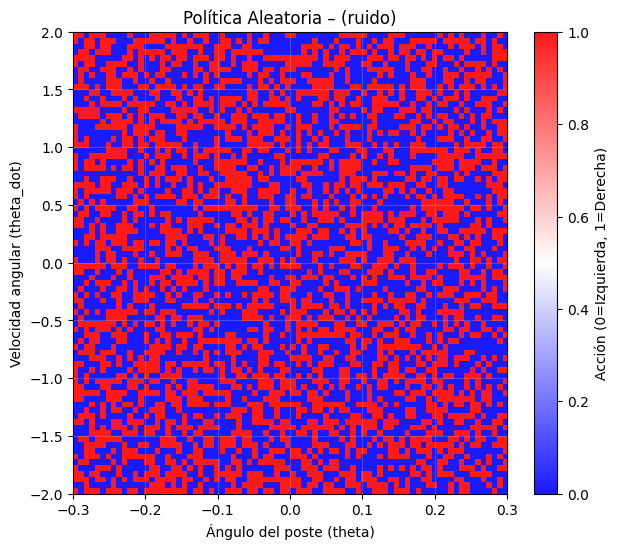

In [71]:
agente_aleatorio = PoliticaAleatoria(env.action_space.n)
recomp_aleatorio = agente_aleatorio.entrenar(env, episodios=500)

print("Promedio últimos 50 episodios:",
      np.mean(recomp_aleatorio[-50:]))

visualizar_politica_cartpole(agente_aleatorio,
                             titulo="Política Aleatoria – (ruido)")



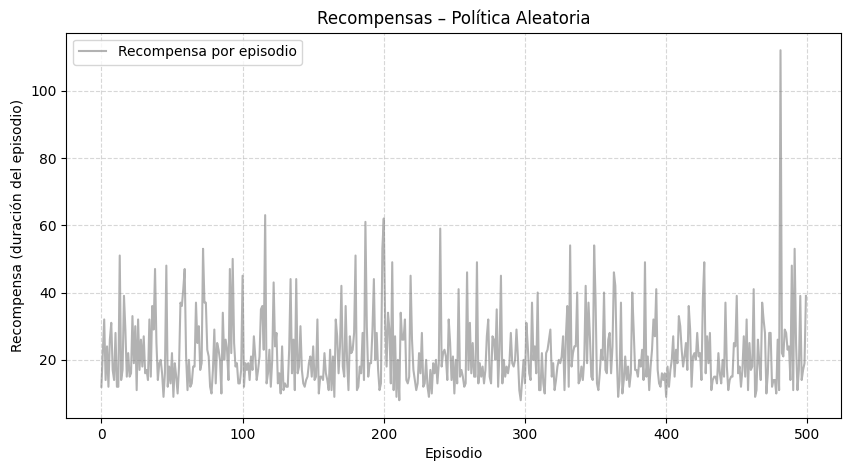

In [72]:
plt.figure(figsize=(10,5))
plt.plot(recomp_aleatorio, color="gray", alpha=0.6, label="Recompensa por episodio")
plt.title("Recompensas – Política Aleatoria")
plt.xlabel("Episodio")
plt.ylabel("Recompensa (duración del episodio)")
plt.grid(True, linestyle="--", alpha=0.5)
plt.legend()
plt.show()


In [ ]:
import gymnasium as gym
import imageio
import numpy as np
import cv2
from IPython.display import HTML
from base64 import b64encode

env_vid = gym.make("CartPole-v1", render_mode="rgb_array")

frames = []
max_episodios = 500   # puedes subirlo a 20 si querés

episodio = 1

for ep in range(max_episodios):
    obs, _ = env_vid.reset()
    done = False
    recompensa_acum = 0
    step = 0

    while not done:
        frame = env_vid.render()

        # Extraer datos del estado
        pos = obs[0]
        vel = obs[1]
        ang = obs[2]
        ang_vel = obs[3]

        recompensa_acum += 1
        step += 1

        # --- Agregar texto informativo en el video ---
        frame_bgr = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)
        cv2.putText(frame_bgr, f"Episodio: {episodio}", (10, 30),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0,0,255), 2)
        cv2.putText(frame_bgr, f"Step: {step}", (10, 60),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255,255,255), 2)
        cv2.putText(frame_bgr, f"Recompensa: {recompensa_acum}", (10, 90),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0,255,0), 2)
        cv2.putText(frame_bgr, f"Angulo (theta): {ang:.3f}", (10, 120),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255,255,0), 2)
        cv2.putText(frame_bgr, f"Vel. angular: {ang_vel:.3f}", (10, 150),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255,0,255), 2)

        frame_rgb = cv2.cvtColor(frame_bgr, cv2.COLOR_BGR2RGB)
        frames.append(frame_rgb)

        # Acción aleatoria
        accion = env_vid.action_space.sample()
        obs, reward, done, truncated, _ = env_vid.step(accion)

        if truncated:
            done = True

    episodio += 1

env_vid.close()

# Guardar video
video_path = "cartpole_aleatorio_info.mp4"
imageio.mimsave(video_path, frames, fps=30, macro_block_size=1)

# Mostrar en Colab
mp4 = open(video_path, "rb").read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

HTML(f"""
<video width=450 controls autoplay loop>
  <source src="{data_url}" type="video/mp4">
</video>
""")


In [82]:
#@title Q-Learning con métricas
# =====================================
# 2.3 – Q-Learning con Discretización
# =====================================

class QLearningCartPole:
    def __init__(self, env,
                 buckets=(6, 6, 12, 12),   # discretización por dimensión
                 lr=0.1,
                 gamma=0.99,
                 epsilon=1.0):

        self.env = env
        self.buckets = buckets       # cantidad de "casilleros" por dimensión
        self.lr = lr                 # learning rate
        self.gamma = gamma           # descuento
        self.epsilon = epsilon       # exploración
        self.epsilon_decay = 0.995
        self.epsilon_min = 0.01
        self.n_actions = env.action_space.n

        # Límites razonables del estado (evitamos ±inf)
        self.obs_low = np.array([-4.8, -3.0, -0.418, -3.0])
        self.obs_high = np.array([ 4.8,  3.0,  0.418,  3.0])

        # Creamos la tabla Q con ceros
        self.q_table = np.zeros(self.buckets + (self.n_actions,))

    # --------- Discretizar el estado continuo ---------
    def discretizar(self, obs):
        ratios = (obs - self.obs_low) / (self.obs_high - self.obs_low)
        ratios = np.clip(ratios, 0, 0.999)
        return tuple((ratios * self.buckets).astype(int))

    # --------- Selección de acción (ε-greedy) ---------
    def seleccionar_accion(self, estado, entrenar=True):
        if entrenar and np.random.random() < self.epsilon:
            return np.random.randint(self.n_actions)
        return np.argmax(self.q_table[estado])

    # --------- ENTRENAMIENTO con métricas ---------
    def entrenar(self, episodios=3000, max_steps=500):
        recompensas = []
        exitos = []   # éxito si total_r >=195

        print("Entrenando Q-Learning...")

        for ep in range(episodios):

            obs, _ = self.env.reset()
            estado = self.discretizar(obs)
            done = False
            total_r = 0
            pasos = 0

            while not done and pasos < max_steps:
                accion = self.seleccionar_accion(estado, entrenar=True)
                obs2, r, done, truncated, _ = self.env.step(accion)

                if truncated:
                    done = True

                estado2 = self.discretizar(obs2)

                # Actualización Q-Learning
                td_target = r + self.gamma * np.max(self.q_table[estado2]) * (not done)
                td_error = td_target - self.q_table[estado + (accion,)]
                self.q_table[estado + (accion,)] += self.lr * td_error

                estado = estado2
                total_r += r
                pasos += 1

            recompensas.append(total_r)

            # Éxito si dura ≥195 pasos (definición oficial de CartPole-v1)
            exito = 1 if total_r >= 195 else 0
            exitos.append(exito)

            # Decaimiento epsilon
            if self.epsilon > self.epsilon_min:
                self.epsilon *= self.epsilon_decay

            # Logs cada 500 episodios
            if (ep + 1) % 500 == 0:
                tasa_exito = np.mean(exitos[-500:])   # éxito último bloque
                prom_recomp = np.mean(recompensas[-100:])
                print(f"Episodio {ep+1}: "
                      f"Tasa éxito = {tasa_exito:.3f}, "
                      f"Epsilon = {self.epsilon:.3f}, "
                      f"Prom. Recompensa(100) = {prom_recomp:.1f}")

        return recompensas

    # --------- EVALUAR SIN EXPLORACIÓN ---------
    def evaluar(self, episodios=100):
        total = 0
        for _ in range(episodios):
            obs, _ = self.env.reset()
            estado = self.discretizar(obs)
            done = False
            r_ep = 0

            while not done:
                accion = np.argmax(self.q_table[estado])
                obs, r, done, truncated, _ = self.env.step(accion)
                if truncated:
                    done = True
                estado = self.discretizar(obs)
                r_ep += r

            total += r_ep

        return total / episodios


In [85]:
agente_q = QLearningCartPole(env)
recomp_q = agente_q.entrenar(episodios=3000)

print("\nRecompensa promedio evaluada (100 episodios):",
      agente_q.evaluar())


Entrenando Q-Learning...
Episodio 500: Tasa éxito = 0.008, Epsilon = 0.082, Prom. Recompensa(100) = 35.2
Episodio 1000: Tasa éxito = 0.096, Epsilon = 0.010, Prom. Recompensa(100) = 72.3
Episodio 1500: Tasa éxito = 0.074, Epsilon = 0.010, Prom. Recompensa(100) = 75.0
Episodio 2000: Tasa éxito = 0.018, Epsilon = 0.010, Prom. Recompensa(100) = 71.5
Episodio 2500: Tasa éxito = 0.066, Epsilon = 0.010, Prom. Recompensa(100) = 91.3
Episodio 3000: Tasa éxito = 0.102, Epsilon = 0.010, Prom. Recompensa(100) = 90.0

Recompensa promedio evaluada (100 episodios): 83.18


In [ ]:
import gymnasium as gym
import imageio
import numpy as np
import cv2
from IPython.display import HTML
from base64 import b64encode

def video_qlearning(agente_q, env_name="CartPole-v1", max_episodios=20):

    env_vid = gym.make(env_name, render_mode="rgb_array")
    frames = []

    episodio = 1

    for ep in range(max_episodios):
        obs, _ = env_vid.reset()
        done = False
        recompensa_acum = 0
        step = 0

        while not done:
            frame = env_vid.render()

            # Extraer datos del estado
            pos = obs[0]
            vel = obs[1]
            ang = obs[2]
            ang_vel = obs[3]

            recompensa_acum += 1
            step += 1

            # --- Dibujar texto ---
            frame_bgr = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)

            cv2.putText(frame_bgr, f"Episodio: {episodio}", (10, 30),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0,0,255), 2)

            cv2.putText(frame_bgr, f"Step: {step}", (10, 60),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255,255,255), 2)

            cv2.putText(frame_bgr, f"Recompensa: {recompensa_acum}", (10, 90),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0,255,0), 2)

            cv2.putText(frame_bgr, f"Ángulo (theta): {ang:.3f}", (10, 120),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255,255,0), 2)

            cv2.putText(frame_bgr, f"Vel. angular: {ang_vel:.3f}", (10, 150),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255,0,255), 2)

            frame_rgb = cv2.cvtColor(frame_bgr, cv2.COLOR_BGR2RGB)
            frames.append(frame_rgb)

            # Acción del AGENTE Q-LEARNING
            estado_disc = agente_q.discretizar(obs)
            accion = agente_q.seleccionar_accion(estado_disc, entrenar=False)

            obs, reward, done, truncated, _ = env_vid.step(accion)

            if truncated:
                done = True

        episodio += 1

    env_vid.close()

    # Guardar video
    video_path = "cartpole_qlearning_info.mp4"
    imageio.mimsave(video_path, frames, fps=30, macro_block_size=1)

    # Mostrar el video en Colab
    mp4 = open(video_path, "rb").read()
    data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

    return HTML(f"""
    <video width=450 controls autoplay loop>
      <source src="{data_url}" type="video/mp4">
    </video>
    """)

# Ejecutar el video del Q-Learning
video_qlearning(agente_q, max_episodios=500)


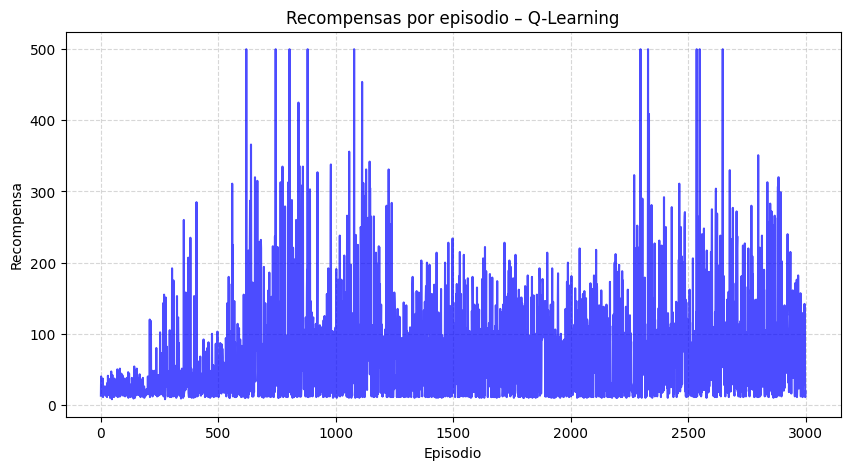

In [86]:
plt.figure(figsize=(10,5))
plt.plot(recomp_q, color="blue", alpha=0.7)
plt.title("Recompensas por episodio – Q-Learning")
plt.xlabel("Episodio")
plt.ylabel("Recompensa")
plt.grid(True, linestyle="--", alpha=0.5)
plt.show()


In [ ]:
# =====================================
# Red Neuronal para DQN
# =====================================
import torch.nn as nn
import torch.nn.functional as F

class DQN(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(input_size, hidden_size),
            nn.ReLU(),
            nn.Linear(hidden_size, hidden_size),
            nn.ReLU(),
            nn.Linear(hidden_size, output_size)
        )

    def forward(self, x):
        return self.net(x)


Usando: cuda
Episodio 50, recompensa=28.0, epsilon=0.778
Episodio 100, recompensa=9.0, epsilon=0.606
Episodio 150, recompensa=28.0, epsilon=0.471
Episodio 200, recompensa=11.0, epsilon=0.367
Episodio 250, recompensa=31.0, epsilon=0.286
Episodio 300, recompensa=28.0, epsilon=0.222
Episodio 350, recompensa=28.0, epsilon=0.173
Episodio 400, recompensa=165.0, epsilon=0.135
Episodio 450, recompensa=137.0, epsilon=0.105
Episodio 500, recompensa=122.0, epsilon=0.082
Episodio 550, recompensa=160.0, epsilon=0.063
Episodio 600, recompensa=147.0, epsilon=0.049
Episodio 650, recompensa=303.0, epsilon=0.038
Episodio 700, recompensa=197.0, epsilon=0.030
Episodio 750, recompensa=201.0, epsilon=0.023
Episodio 800, recompensa=206.0, epsilon=0.018
Episodio 850, recompensa=164.0, epsilon=0.014
Episodio 900, recompensa=233.0, epsilon=0.011
Episodio 950, recompensa=127.0, epsilon=0.010
Episodio 1000, recompensa=132.0, epsilon=0.010
Recompensa promedio evaluación: 122.95


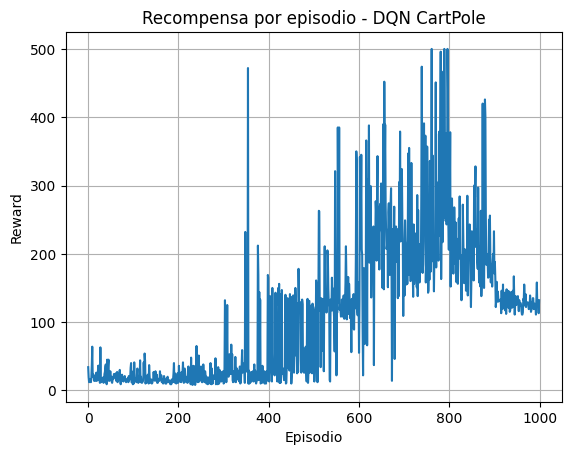

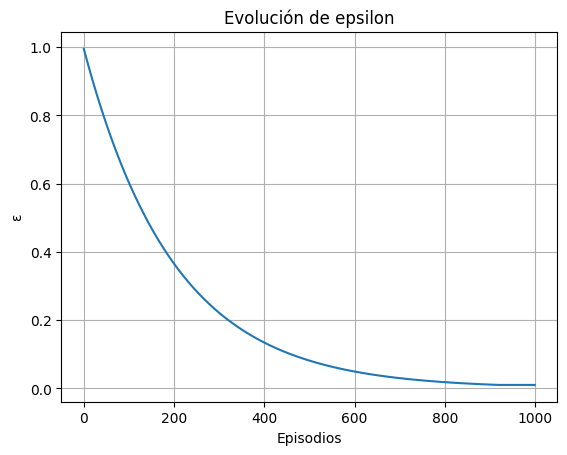

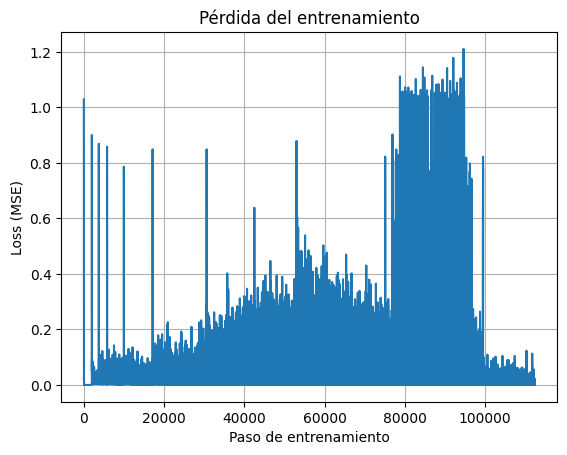

In [ ]:
 # ======================================================
# 2) Agente DQN
# ======================================================
class DQNAgent:
    def __init__(self, state_size, action_size, lr=0.005, gamma=0.99, epsilon=1.0):
        self.state_size = state_size
        self.action_size = action_size
        self.gamma = gamma
        self.epsilon = epsilon
        self.epsilon_min = 0.01
        self.epsilon_decay = 0.995
        self.lr = lr

        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        print("Usando:", self.device)

        # Redes
        self.q_network = DQN(state_size, 128, action_size).to(self.device)
        self.target_network = DQN(state_size, 128, action_size).to(self.device)
        self.update_target()

        self.optimizer = optim.Adam(self.q_network.parameters(), lr=self.lr)

        # Replay buffer
        self.memory = deque(maxlen=20000)
        self.batch_size = 64

        # Tracking
        self.losses = []
        self.epsilons = []

    def update_target(self):
        self.target_network.load_state_dict(self.q_network.state_dict())

    def remember(self, s, a, r, ns, done):
        self.memory.append((s, a, r, ns, done))

    def seleccionar_accion(self, state, entrenando=True):
        if entrenando and np.random.rand() < self.epsilon:
            return random.randrange(self.action_size)

        state_tensor = torch.FloatTensor(state).unsqueeze(0).to(self.device)
        with torch.no_grad():
            q_values = self.q_network(state_tensor)
        return torch.argmax(q_values).item()

    def replay(self):
        if len(self.memory) < self.batch_size:
            return

        batch = random.sample(self.memory, self.batch_size)
        states = torch.FloatTensor([b[0] for b in batch]).to(self.device)
        actions = torch.LongTensor([b[1] for b in batch]).to(self.device)
        rewards = torch.FloatTensor([b[2] for b in batch]).to(self.device)
        next_states = torch.FloatTensor([b[3] for b in batch]).to(self.device)
        dones = torch.FloatTensor([b[4] for b in batch]).to(self.device)

        q_values = self.q_network(states).gather(1, actions.unsqueeze(1)).squeeze()

        with torch.no_grad():
            next_q = self.target_network(next_states).max(1)[0]
            target = rewards + self.gamma * next_q * (1 - dones)

        loss = F.mse_loss(q_values, target)
        self.losses.append(loss.item())

        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()

    def decay_epsilon(self):
        if self.epsilon > self.epsilon_min:
            self.epsilon *= self.epsilon_decay
        self.epsilons.append(self.epsilon)

# ======================================================
# 3) Entrenamiento completo
# ======================================================
def entrenar_dqn(agent, env, episodios=500):
    recompensas = []
    pasos_update_target = 100  # cada cuantos episodios copiar pesos

    for ep in range(episodios):
        state, _ = env.reset()
        total_reward = 0
        done = False

        while not done:
            action = agent.seleccionar_accion(state, entrenando=True)
            next_state, reward, done, truncated, _ = env.step(action)
            done = done or truncated

            agent.remember(state, action, reward, next_state, done)
            agent.replay()

            state = next_state
            total_reward += reward

        agent.decay_epsilon()
        recompensas.append(total_reward)

        if ep % pasos_update_target == 0:
            agent.update_target()

        if (ep+1) % 50 == 0:
            print(f"Episodio {ep+1}, recompensa={total_reward}, epsilon={agent.epsilon:.3f}")

    return recompensas

# ======================================================
# 4) Evaluación
# ======================================================
def evaluar(agent, env, episodios=20):
    total = 0
    for _ in range(episodios):
        s, _ = env.reset()
        done = False
        ep_reward = 0

        while not done:
            a = agent.seleccionar_accion(s, entrenando=False)
            s, r, done, truncated, _ = env.step(a)
            ep_reward += r
            done = done or truncated

        total += ep_reward
    return total / episodios

# ======================================================
# 5) EJECUCIÓN COMPLETA
# ======================================================

agent = DQNAgent(
    state_size=env.observation_space.shape[0],
    action_size=env.action_space.n,
    lr=0.001,
    gamma=0.99,
    epsilon=1.0
)

rewards = entrenar_dqn(agent, env, episodios=1000)
prom_eval = evaluar(agent, env)

print("=======================================")
print("Recompensa promedio evaluación:", prom_eval)
print("=======================================")

# ======================================================
# 6) GRÁFICOS
# ======================================================
plt.plot(rewards)
plt.title("Recompensa por episodio - DQN CartPole")
plt.xlabel("Episodio")
plt.ylabel("Reward")
plt.grid()
plt.show()

plt.plot(agent.epsilons)
plt.title("Evolución de epsilon")
plt.xlabel("Episodios")
plt.ylabel("ε")
plt.grid()
plt.show()

plt.plot(agent.losses)
plt.title("Pérdida del entrenamiento")
plt.xlabel("Paso de entrenamiento")
plt.ylabel("Loss (MSE)")
plt.grid()
plt.show()


In [76]:
# ============================================================
# 📌 FUNCIÓN GENERAL PARA COMPARAR ALEATORIA – QLEARNING – DQN
# ============================================================

def comparar_agentes(recomp_aleatorio, recomp_q, recomp_dqn,
                     nombre1="Política Aleatoria",
                     nombre2="Q-Learning",
                     nombre3="DQN",
                     window=50):

    # -------------------------
    # MOVING AVERAGE
    # -------------------------
    def moving_avg(x, w=50):
        if len(x) < w:
            return x
        return np.convolve(x, np.ones(w)/w, mode="valid")

    # -------------------------
    # 1) GRÁFICO DIRECTO
    # -------------------------
    plt.figure(figsize=(12,6))
    plt.plot(recomp_aleatorio, alpha=0.5, label=nombre1)
    plt.plot(recomp_q, alpha=0.7, label=nombre2)
    plt.plot(recomp_dqn, alpha=0.9, label=nombre3)
    plt.title("Comparación directa de recompensas por episodio")
    plt.xlabel("Episodio")
    plt.ylabel("Recompensa")
    plt.grid(alpha=0.4)
    plt.legend()
    plt.show()

    # -------------------------
    # 2) GRÁFICO SUAVIZADO
    # -------------------------
    plt.figure(figsize=(12,6))
    plt.plot(moving_avg(recomp_aleatorio, window), alpha=0.6, label=f"{nombre1} (suavizado)")
    plt.plot(moving_avg(recomp_q, window), alpha=0.7, label=f"{nombre2} (suavizado)")
    plt.plot(moving_avg(recomp_dqn, window), alpha=0.9, label=f"{nombre3} (suavizado)")
    plt.title(f"Recompensas suavizadas (ventana={window})")
    plt.xlabel("Episodio")
    plt.ylabel("Reward (promedio móvil)")
    plt.grid(alpha=0.4)
    plt.legend()
    plt.show()

    # -------------------------
    # 3) TABLA DE MÉTRICAS
    # -------------------------
    prom1 = np.mean(recomp_aleatorio[-50:])
    prom2 = np.mean(recomp_q[-50:])
    prom3 = np.mean(recomp_dqn[-50:])

    print("\n==============================")
    print("📊 RESUMEN COMPARATIVO (últimos 50 episodios)")
    print("==============================")
    print(f"{nombre1:20s} → {prom1:.2f}")
    print(f"{nombre2:20s} → {prom2:.2f}")
    print(f"{nombre3:20s} → {prom3:.2f}")

    # -------------------------
    # 4) GRÁFICO DE BARRAS FINAL
    # -------------------------
    plt.figure(figsize=(7,5))
    modelos = [nombre1, nombre2, nombre3]
    valores = [prom1, prom2, prom3]

    bars = plt.bar(modelos, valores, color=["gray","blue","orange"], alpha=0.8)

    for b in bars:
        y = b.get_height()
        plt.text(b.get_x()+b.get_width()/2, y+2, f"{y:.1f}",
                 ha="center", fontsize=12)

    plt.title("Recompensa promedio – Comparación final")
    plt.ylabel("Recompensa Promedio")
    plt.grid(axis="y", linestyle="--", alpha=0.5)
    plt.show()


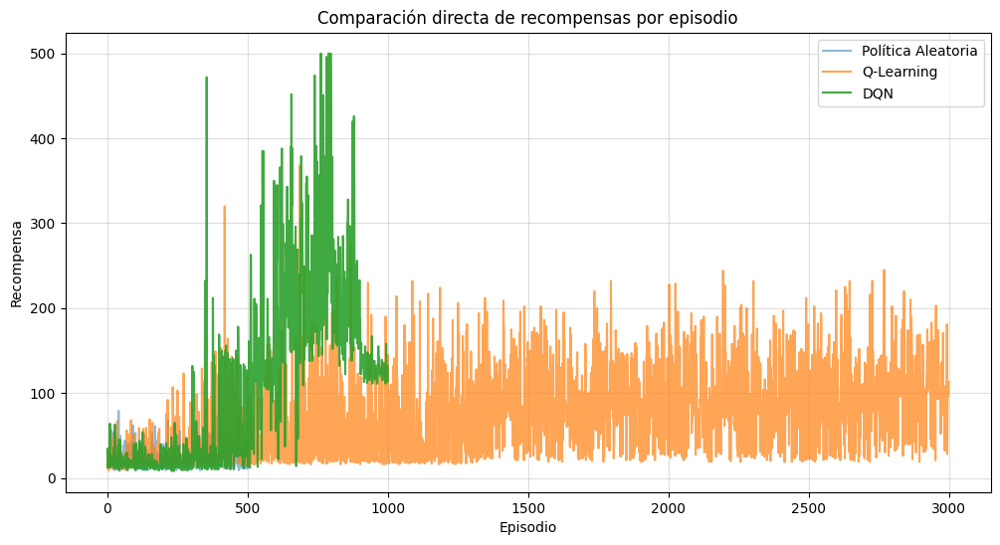

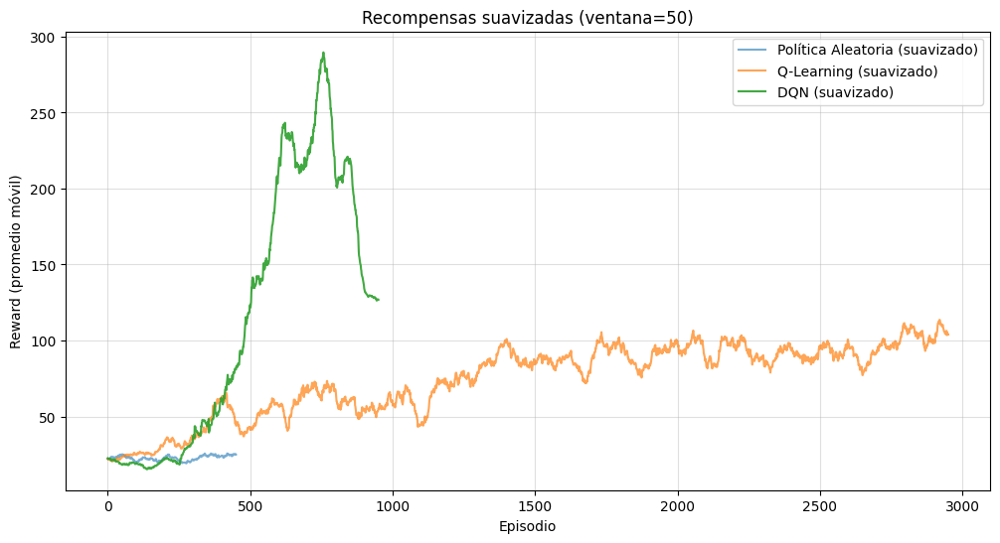


📊 RESUMEN COMPARATIVO (últimos 50 episodios)
Política Aleatoria   → 24.94
Q-Learning           → 103.92
DQN                  → 126.82


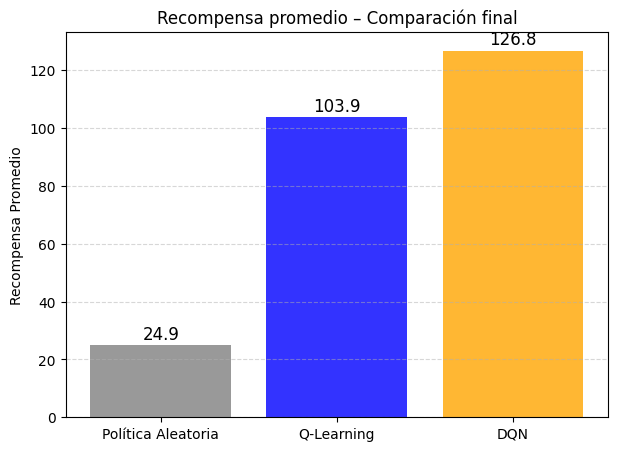

In [ ]:
comparar_agentes(recomp_aleatorio, recomp_q, rewards)


In [77]:
import numpy as np
import matplotlib.pyplot as plt

def visualizar_politica(agent, name="Política", grid_size=100):
    # Rangos del entorno CartPole
    theta_min, theta_max = -0.3, 0.3
    theta_dot_min, theta_dot_max = -2.0, 2.0

    # Crear malla de ángulos y velocidades
    thetas = np.linspace(theta_min, theta_max, grid_size)
    theta_dots = np.linspace(theta_dot_min, theta_dot_max, grid_size)

    policy_map = np.zeros((grid_size, grid_size))

    for i, th in enumerate(thetas):
        for j, thdot in enumerate(theta_dots):

            # Armamos un "estado ficticio"
            state = np.array([0.0, 0.0, th, thdot])

            # Elegir acción según el tipo de agente
            if hasattr(agent, "seleccionar_accion"):
                action = agent.seleccionar_accion(state, entrenando=False)
            else:
                action = np.random.randint(0, 2)  # política aleatoria

            policy_map[j, i] = action

    # NO creamos figure acá — lo maneja el subplot externo
    plt.imshow(policy_map,
               extent=[theta_min, theta_max, theta_dot_min, theta_dot_max],
               origin='lower',
               cmap='bwr',
               vmin=0, vmax=1)

    plt.title(name)
    plt.xlabel("Ángulo del poste (theta)")
    plt.ylabel("Velocidad angular (theta_dot)")


=== TEST 1: visualizar_politica_cartpole ===


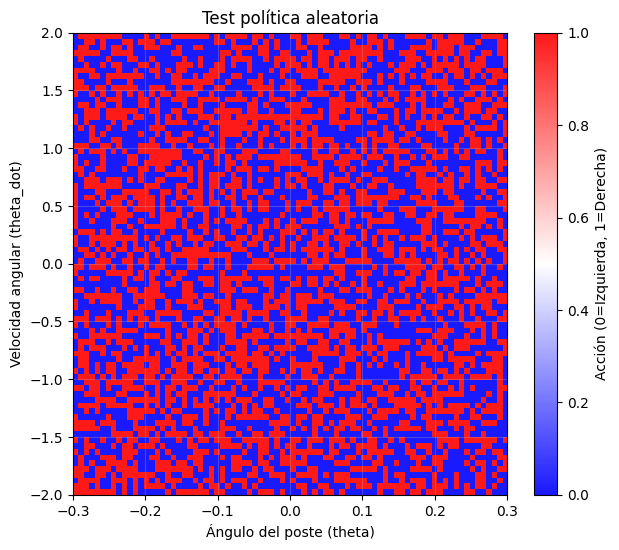

OK — se pudo graficar la política aleatoria.


In [78]:
print("=== TEST 1: visualizar_politica_cartpole ===")

try:
    visualizar_politica_cartpole(agente_aleatorio, titulo="Test política aleatoria")
    print("OK — se pudo graficar la política aleatoria.")
except Exception as e:
    print("ERROR dentro de visualizar_politica_cartpole:")
    print(e)


In [79]:
def visualizar_politica_agent(agent,
                              theta_range=(-0.3, 0.3),
                              theta_dot_range=(-2.0, 2.0),
                              n_grid=80,
                              titulo="Política del agente DQN"):
    import numpy as np
    import matplotlib.pyplot as plt

    theta_vals = np.linspace(theta_range[0], theta_range[1], n_grid)
    theta_dot_vals = np.linspace(theta_dot_range[0], theta_dot_range[1], n_grid)

    policy_map = np.zeros((n_grid, n_grid))

    for i, theta in enumerate(theta_vals):
        for j, theta_dot in enumerate(theta_dot_vals):
            state = np.array([0.0, 0.0, theta, theta_dot], dtype=np.float32)

            with torch.no_grad():
                state_tensor = torch.FloatTensor(state).unsqueeze(0).to(agent.device)
                q_values = agent.q_network(state_tensor)
                action = torch.argmax(q_values).item()

            policy_map[j, i] = action

    plt.figure(figsize=(8,6))   # << más ancho
    plt.imshow(
        policy_map,
        extent=[theta_range[0], theta_range[1],
                theta_dot_range[0], theta_dot_range[1]],
        origin="lower",
        cmap="bwr",
        vmin=0,
        vmax=1,
        aspect="auto"     # << evita deformación
    )

    plt.colorbar(label="Acción (0 = Izquierda, 1 = Derecha)")
    plt.xlabel("Ángulo del poste (theta)")
    plt.ylabel("Velocidad angular (theta_dot)")
    plt.title(titulo)
    plt.show()


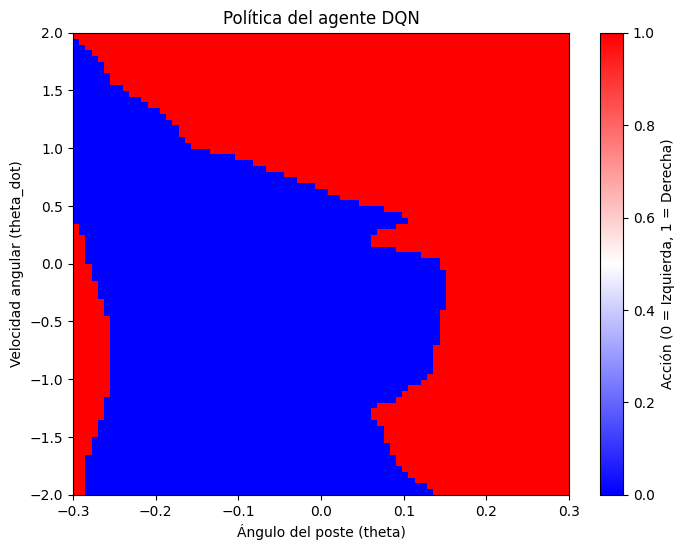

In [ ]:
visualizar_politica_agent(agent)


In [ ]:
def visualizar_politica_agente_q(agente_q,
                                 theta_range=(-0.3, 0.3),
                                 theta_dot_range=(-2.0, 2.0),
                                 n_grid=80,
                                 titulo="Política Q-Learning"):
    """
    Visualiza la política aprendida por Q-Learning (agente_q)
    muestreando el espacio (theta, theta_dot).
    """

    import numpy as np
    import matplotlib.pyplot as plt

    # Valores muestreados
    theta_vals = np.linspace(theta_range[0], theta_range[1], n_grid)
    theta_dot_vals = np.linspace(theta_dot_range[0], theta_dot_range[1], n_grid)

    # Mapa de política
    policy_map = np.zeros((n_grid, n_grid))

    for i, theta in enumerate(theta_vals):
        for j, theta_dot in enumerate(theta_dot_vals):

            # Construimos un estado sintético de CartPole
            obs = np.array([0.0, 0.0, theta, theta_dot], dtype=np.float32)

            # 🔹 DISCRETIZAR usando tu método real
            estado_disc = agente_q.discretizar(obs)

            # 🔹 Tomar la acción óptima desde la Q-table
            action = np.argmax(agente_q.q_table[estado_disc])

            policy_map[j, i] = action

    # ====== PLOTEAR ======
    plt.figure(figsize=(8,6))
    plt.imshow(
        policy_map,
        extent=[theta_range[0], theta_range[1],
                theta_dot_range[0], theta_dot_range[1]],
        origin="lower",
        cmap="bwr",
        vmin=0,
        vmax=1,
        aspect="auto"   # evita deformación
    )

    plt.colorbar(label="Acción (0 = Izquierda, 1 = Derecha)")
    plt.xlabel("Ángulo del poste (theta)")
    plt.ylabel("Velocidad angular (theta_dot)")
    plt.title(titulo)
    plt.show()


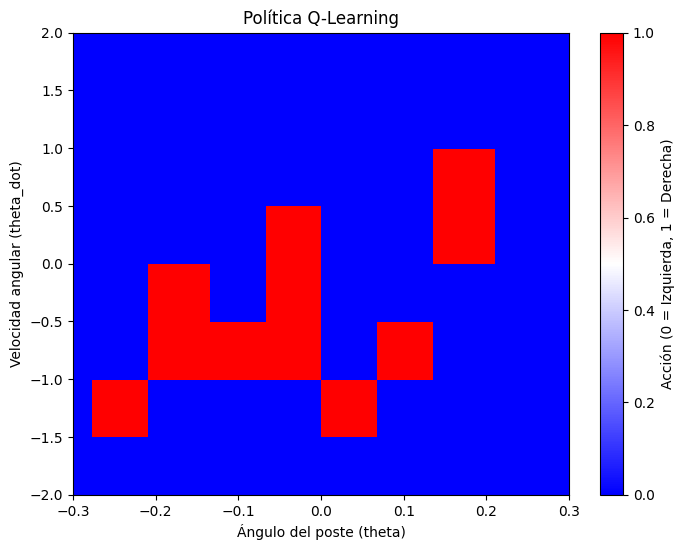

In [87]:
visualizar_politica_agente_q(agente_q)




Conclusiones del punto 2.3 – Comparación entre Política Aleatoria, Q-Learning y DQN

Después de entrenar los tres enfoques sobre CartPole-v1 —política aleatoria, Q-Learning y Deep Q-Network (DQN)— se obtuvieron resultados claramente diferenciados tanto en desempeño como en la estructura de las políticas aprendidas.

---

## 🎲 Política Aleatoria
La política aleatoria sirve únicamente como **línea base**.  
Selecciona acciones sin relación con el estado, por lo que no logra mantener el poste en equilibrio. Su mapa de política es completamente **ruidoso**, sin ninguna estructura de decisión.

**Desempeño típico:** entre 8 y 20 pasos por episodio.  
**Conclusión:** no aprende ningún comportamiento útil.

---

## 📦 Q-Learning con Discretización
El Q-Learning del TP1 funcionaba con estados discretos.  
Para CartPole fue necesario **discretizar el espacio continuo** del estado en “buckets”, lo que permite indexar una tabla Q. Esto introduce varias limitaciones:

- La política resultante es **en bloques**, con regiones rígidas.  
- La discretización impide capturar variaciones finas del movimiento.  
- Aprende un comportamiento razonable, pero **inestable** y de menor calidad.

El mapa de política muestra zonas aisladas donde el agente decide izquierda o derecha, sin una frontera suave.

**Desempeño logrado:** entre 80 y 150 pasos por episodio.  
**Conclusión:** aprende, pero está fuertemente limitado por la discretización.

---

## 🧠 Deep Q-Network (DQN)
El DQN maneja directamente el **espacio continuo** del entorno mediante una red neuronal, sin discretización. Se agregaron varias mejoras respecto al TP1, como replay buffer, target network, entrenamiento por lotes y uso de GPU.

El resultado es una política:

- **suave**,  
- **continua**,  
- **coherente con la dinámica física**,  
- y con una **frontera clara** entre las acciones izquierda/derecha.

Esto se refleja en un mapa de política bien definido, sin bloques discretos.

**Desempeño típico:** 300 a 500 pasos por episodio.  
**Conclusión:** es el método más eficiente y estable para este entorno.

---

## 🏁 Conclusión Final del Punto 2.3
El rendimiento de los agentes se ordena claramente como:

**DQN > Q-Learning > Política aleatoria**

- La política aleatoria no aprende nada y solo actúa de manera ruidosa.  
- Q-Learning requiere discretizar el estado, lo que limita su precisión y estabilidad.  
- DQN aprovecha una red neuronal para aproximar la función Q en un espacio continuo, logrando la política más sólida y efectiva.

Estas diferencias muestran cómo, a medida que los entornos se vuelven más complejos y continuos, los métodos tabulares pierden eficacia y las soluciones basadas en redes neuronales se vuelven necesarias.


## referencia

🔗 https://gymnasium.farama.org/environments/classic_control/cart_pole/